In [1]:
import numpy as np 
import pandas as pd 
import geopy.distance
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/russia-real-estate-2021/input_data.csv


In [2]:
df = pd.read_csv('/kaggle/input/russia-real-estate-2021/input_data.csv', sep = ';')

Добавим колонку цен на квадратный метр

In [3]:
df['price_per_metr'] = df.price/df.area

In [4]:
df.isna().sum()

date                    0
price                   0
level                   0
levels                  0
rooms                   0
area                    0
kitchen_area            0
geo_lat                 0
geo_lon                 0
building_type           0
object_type             0
postal_code        507771
street_id         4205554
id_region               0
house_id          3261943
price_per_metr          0
dtype: int64

In [5]:
# Удаляем ненужные колонки с пропусками
df.drop(columns = ['postal_code', 'street_id', 'house_id'], inplace = True)

In [6]:
moscow_df = df[df.id_region == 77]
saint_petersburg_df = df[df.id_region == 78]

In [7]:
print('Размерность выборки до удаления выборосов: ',moscow_df.shape)

Q1 = moscow_df.price.quantile(0.25)
Q3 = moscow_df.price.quantile(0.75)
IQR = Q3 - Q1
moscow_df = moscow_df[(moscow_df.price > (Q1 - 1.5*IQR)) & (moscow_df.price < (Q3 + 1.5*IQR))]

Q1 = moscow_df.area.quantile(0.25)
Q3 = moscow_df.area.quantile(0.75)
IQR = Q3 - Q1
moscow_df = moscow_df[(moscow_df.area > (Q1 - 1.5*IQR)) & (moscow_df.area < (Q3 + 1.5*IQR))]

Q1 = moscow_df.kitchen_area.quantile(0.25)
Q3 = moscow_df.kitchen_area.quantile(0.75)
IQR = Q3 - Q1
moscow_df = moscow_df[(moscow_df.kitchen_area > (Q1 - 1.5*IQR)) & (moscow_df.kitchen_area < (Q3 + 1.5*IQR))]

Q1 = moscow_df.price_per_metr.quantile(0.25)
Q3 = moscow_df.price_per_metr.quantile(0.75)
IQR = Q3 - Q1
moscow_df = moscow_df[(moscow_df.price_per_metr > (Q1 - 1.5*IQR)) & (moscow_df.price_per_metr < (Q3 + 1.5*IQR))]

for i in moscow_df.columns[moscow_df.dtypes != 'object']: 
    if i != 'rooms':
        moscow_df = moscow_df[moscow_df[i] >= 0]
print('Размерность выборки после удаления выбросов: ',moscow_df.shape)

Размерность выборки до удаления выборосов:  (1032600, 13)
Размерность выборки после удаления выбросов:  (814812, 13)


In [8]:
print('Размерность выборки до удаления выборосов: ',saint_petersburg_df.shape)

Q1 = saint_petersburg_df.price.quantile(0.25)
Q3 = saint_petersburg_df.price.quantile(0.75)
IQR = Q3 - Q1
saint_petersburg_df = saint_petersburg_df[(saint_petersburg_df.price > (Q1 - 1.5*IQR)) & (saint_petersburg_df.price < (Q3 + 1.5*IQR))]

Q1 = saint_petersburg_df.area.quantile(0.25)
Q3 = saint_petersburg_df.area.quantile(0.75)
IQR = Q3 - Q1
saint_petersburg_df = saint_petersburg_df[(saint_petersburg_df.area > (Q1 - 1.5*IQR)) & (saint_petersburg_df.area < (Q3 + 1.5*IQR))]

Q1 = saint_petersburg_df.kitchen_area.quantile(0.25)
Q3 = saint_petersburg_df.kitchen_area.quantile(0.75)
IQR = Q3 - Q1
saint_petersburg_df = saint_petersburg_df[(saint_petersburg_df.kitchen_area > (Q1 - 1.5*IQR)) & (saint_petersburg_df.kitchen_area < (Q3 + 1.5*IQR))]

Q1 = saint_petersburg_df.price_per_metr.quantile(0.25)
Q3 = saint_petersburg_df.price_per_metr.quantile(0.75)
IQR = Q3 - Q1
saint_petersburg_df = saint_petersburg_df[(saint_petersburg_df.price_per_metr > (Q1 - 1.5*IQR)) & (saint_petersburg_df.price_per_metr < (Q3 + 1.5*IQR))]

for i in saint_petersburg_df.columns[saint_petersburg_df.dtypes != 'object']:  
    if i != 'rooms':
        saint_petersburg_df = saint_petersburg_df[saint_petersburg_df[i] >= 0]
print('Размерность выборки после удаления выбросов: ',saint_petersburg_df.shape)

Размерность выборки до удаления выборосов:  (765872, 13)
Размерность выборки после удаления выбросов:  (590446, 13)


In [9]:
saint_petersburg_df.head(5)

,date,price,level,levels,rooms,area,kitchen_area,geo_lat,geo_lon,building_type,object_type,id_region,price_per_metr
15,2021-01-01,8865000,10,13,2,66.70,14.60,59.851179,30.411657,4,2,78,132908.545727
108,2021-01-01,7068330,12,13,1,42.30,18.70,55.638429,37.652912,0,2,78,167100.000000
151,2021-01-01,8865000,11,13,2,66.70,14.60,59.851179,30.411657,4,2,78,132908.545727
221,2021-01-01,3965000,20,23,1,30.50,13.00,60.030667,30.459275,0,2,78,130000.000000
231,2021-01-01,7408788,17,17,1,37.11,12.92,59.966552,30.401271,1,2,78,199643.977365


In [10]:
saint_pet_centre = (59.938996, 30.315482)
moscow_centre = (55.751003, 37.617964)

In [11]:
sp = np.concatenate([saint_petersburg_df.geo_lat.values.reshape(-1,1), saint_petersburg_df.geo_lon.values.reshape(-1,1)], axis = 1)
ms = np.concatenate([moscow_df.geo_lat.values.reshape(-1,1), moscow_df.geo_lon.values.reshape(-1,1)], axis = 1)

In [12]:
%%time
dist_spb = list(map(lambda x: geopy.distance.geodesic(x, saint_pet_centre).km, sp))
dist_msk = list(map(lambda x: geopy.distance.geodesic(x, moscow_centre).km, ms))

CPU times: user 5min 53s, sys: 218 ms, total: 5min 53s
Wall time: 5min 54s


In [13]:
saint_petersburg_df['distance_from_centre'] = dist_spb
moscow_df['distance_from_centre'] = dist_msk

In [14]:
# Удаляем ненужные колонки
saint_petersburg_df = saint_petersburg_df.drop(columns = ['date', 'id_region', 'geo_lat', 'geo_lon'])
moscow_df = moscow_df.drop(columns = ['date', 'id_region', 'geo_lat', 'geo_lon'])

In [15]:
# удаляем выбросы по расстоянию
moscow_df = moscow_df[moscow_df.distance_from_centre < 50]
saint_petersburg_df = saint_petersburg_df[saint_petersburg_df.distance_from_centre < 50]

In [16]:
moscow_df

,price,level,levels,rooms,area,kitchen_area,building_type,object_type,price_per_metr,distance_from_centre
10,3350000,1,19,-1,10.10,2.0,3,0,331683.168317,5.736933
38,22112640,8,29,3,69.80,11.6,0,2,316800.000000,9.426419
140,7400000,9,9,1,32.30,5.2,3,0,229102.167183,6.198552
150,3000000,1,5,1,13.60,2.0,4,0,220588.235294,4.617517
157,25173570,19,22,2,90.50,0.0,0,2,278160.994475,6.096151
...,...,...,...,...,...,...,...,...,...,...
11358120,6612000,12,16,-1,20.50,0.0,0,2,322536.585366,21.921708
11358125,22129552,20,22,3,85.84,9.6,0,2,257800.000000,20.824162
11358126,9080000,11,16,2,35.50,14.8,0,2,255774.647887,21.921708
11358129,8595000,2,10,1,37.70,13.9,0,2,227984.084881,21.921708


In [17]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
moscow_df.describe()

,price,level,levels,rooms,area,kitchen_area,building_type,object_type,price_per_metr,distance_from_centre
count,806600.000,806600.000,806600.000,806600.000,806600.000,806600.000,806600.000,806600.000,806600.000,806600.000
mean,13795646.953,9.181,17.456,1.634,51.313,9.078,0.793,0.867,271329.387,13.072
std,6446267.116,6.918,8.557,1.124,19.145,6.589,1.436,0.991,76802.708,8.145
min,790000.000,0.000,0.000,-1.000,4.000,0.000,0.000,0.000,48611.111,0.041
25%,9150000.000,4.000,12.000,1.000,37.900,5.100,0.000,0.000,213636.364,7.035
50%,12300000.000,8.000,16.000,2.000,47.500,9.000,0.000,0.000,256153.846,12.056
75%,17035892.000,13.000,23.000,2.000,63.600,12.900,2.000,2.000,320032.034,17.318
max,37288650.000,48.000,50.000,9.000,105.370,30.200,6.000,2.000,489949.749,48.245


In [18]:
saint_petersburg_df.describe()

,price,level,levels,rooms,area,kitchen_area,building_type,object_type,price_per_metr,distance_from_centre
count,585380.000,585380.000,585380.000,585380.000,585380.000,585380.000,585380.000,585380.000,585380.000,585380.000
mean,7723327.105,7.696,14.504,1.313,46.920,9.105,0.425,0.846,166624.564,10.654
std,3437667.290,5.775,7.108,1.264,18.321,6.180,1.069,0.988,39179.358,6.924
min,120000.000,0.000,0.000,-1.000,1.500,0.000,0.000,0.000,54411.765,0.019
25%,5201935.250,3.000,9.000,1.000,33.200,5.200,0.000,0.000,137838.131,6.205
50%,6900000.000,6.000,13.000,1.000,42.700,9.520,0.000,0.000,162079.135,10.314
75%,9400305.000,11.000,21.000,2.000,59.000,13.200,0.000,2.000,191005.019,13.614
max,20255552.000,35.000,45.000,9.000,99.100,31.930,6.000,2.000,279527.719,48.066


Text(0.0, 1.0, 'Распределение цены на метр')

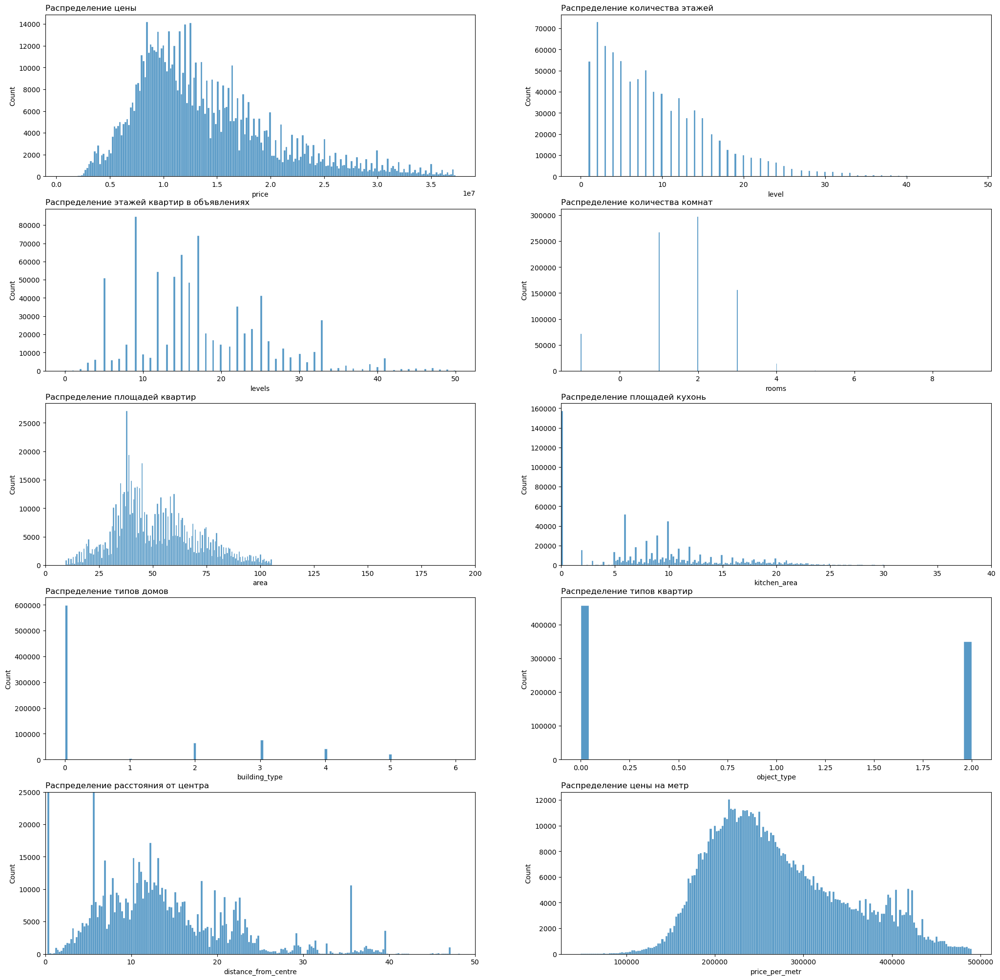

In [19]:
fig, axes = plt.subplots(5, 2, figsize = (25, 25))
sns.set()

sns.histplot(data = moscow_df.price, ax = axes[0, 0])
axes[0, 0].set_title('Распределение цены', loc = 'left')

sns.histplot(data = moscow_df.level, ax = axes[0, 1])
axes[0, 1].set_title('Распределение количества этажей', loc = 'left')

sns.histplot(data = moscow_df.levels, ax = axes[1, 0])
axes[1, 0].set_title('Распределение этажей квартир в объявлениях', loc = 'left')

sns.histplot(data = moscow_df.rooms, ax = axes[1, 1])
axes[1, 1].set_title('Распределение количества комнат', loc = 'left')

sns.histplot(data = moscow_df.area, ax = axes[2, 0])
axes[2, 0].set_title('Распределение площадей квартир', loc = 'left')
axes[2, 0].set_xlim([0, 200])

sns.histplot(data = moscow_df.kitchen_area, ax = axes[2, 1])
axes[2, 1].set_title('Распределение площадей кухонь', loc = 'left')
axes[2, 1].set_xlim([0, 40])

sns.histplot(data = moscow_df.building_type, ax = axes[3, 0])
axes[3, 0].set_title('Распределение типов домов', loc = 'left')

sns.histplot(data = moscow_df.object_type, ax = axes[3, 1])
axes[3, 1].set_title('Распределение типов квартир', loc = 'left')

sns.histplot(data = moscow_df.distance_from_centre, ax = axes[4, 0])
axes[4, 0].set_title('Распределение расстояния от центра', loc = 'left')
axes[4, 0].set_ylim([0, 25000])
axes[4, 0].set_xlim([0, 50])

sns.histplot(data = moscow_df.price_per_metr, ax = axes[4, 1])
axes[4, 1].set_title('Распределение цены на метр', loc = 'left')
# axes[4, 1].set_ylim([0, 25000])
# axes[4, 1].set_xlim([0, 50])

Text(0.0, 1.0, 'Распределение расстояния от центра')

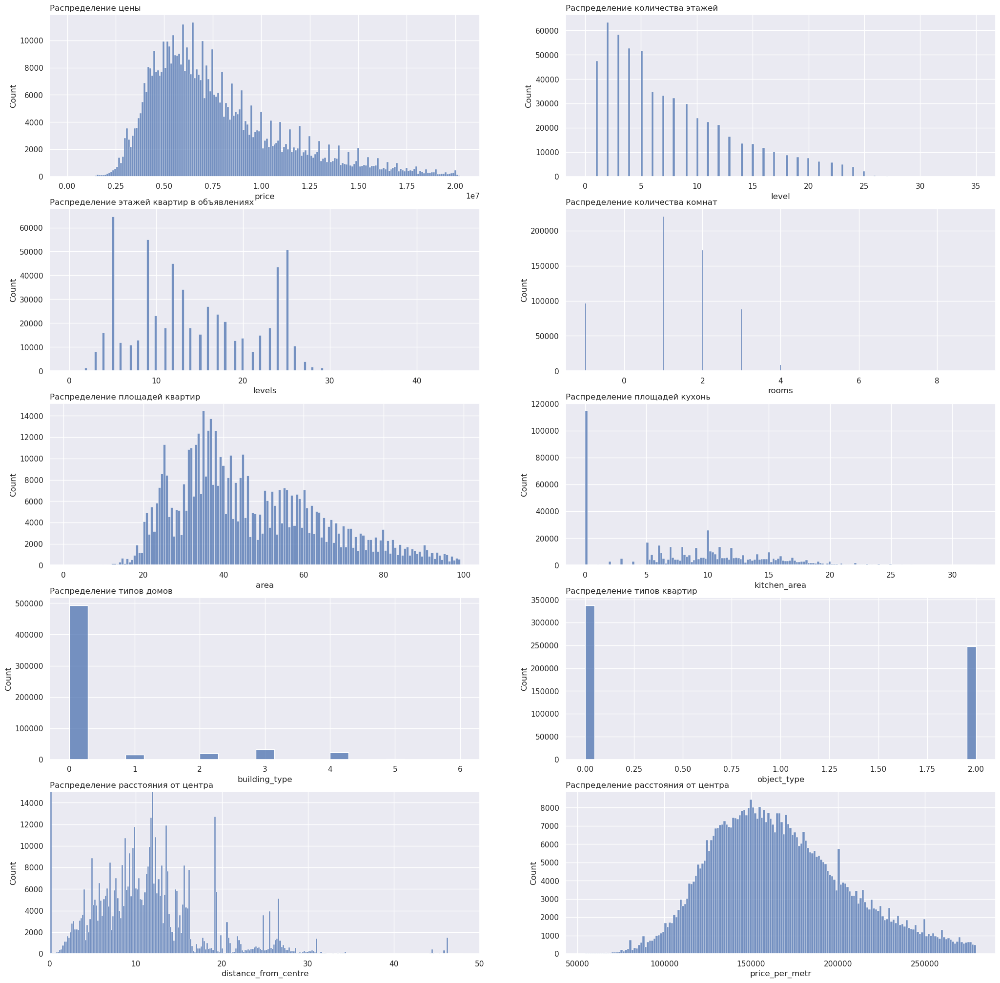

In [20]:
fig, axes = plt.subplots(5, 2, figsize = (25, 25))
sns.set()

sns.histplot(data = saint_petersburg_df.price, ax = axes[0, 0])
axes[0, 0].set_title('Распределение цены', loc = 'left')

sns.histplot(data = saint_petersburg_df.level, ax = axes[0, 1])
axes[0, 1].set_title('Распределение количества этажей', loc = 'left')

sns.histplot(data = saint_petersburg_df.levels, ax = axes[1, 0])
axes[1, 0].set_title('Распределение этажей квартир в объявлениях', loc = 'left')

sns.histplot(data = saint_petersburg_df.rooms, ax = axes[1, 1])
axes[1, 1].set_title('Распределение количества комнат', loc = 'left')

sns.histplot(data = saint_petersburg_df.area, ax = axes[2, 0])
axes[2, 0].set_title('Распределение площадей квартир', loc = 'left')
axes[4, 0].set_xlim([0, 200])

sns.histplot(data = saint_petersburg_df.kitchen_area, ax = axes[2, 1])
axes[2, 1].set_title('Распределение площадей кухонь', loc = 'left')
axes[4, 0].set_xlim([0, 40])

sns.histplot(data = saint_petersburg_df.building_type, ax = axes[3, 0])
axes[3, 0].set_title('Распределение типов домов', loc = 'left')

sns.histplot(data = saint_petersburg_df.object_type, ax = axes[3, 1])
axes[3, 1].set_title('Распределение типов квартир', loc = 'left')

sns.histplot(data = saint_petersburg_df.distance_from_centre, ax = axes[4, 0])
axes[4, 0].set_title('Распределение расстояния от центра', loc = 'left')
axes[4, 0].set_xlim([0, 50])
axes[4, 0].set_ylim([0, 15000])

sns.histplot(data = saint_petersburg_df.price_per_metr, ax = axes[4, 1])
axes[4, 1].set_title('Распределение расстояния от центра', loc = 'left')

<Axes: xlabel='price_per_metr', ylabel='price'>

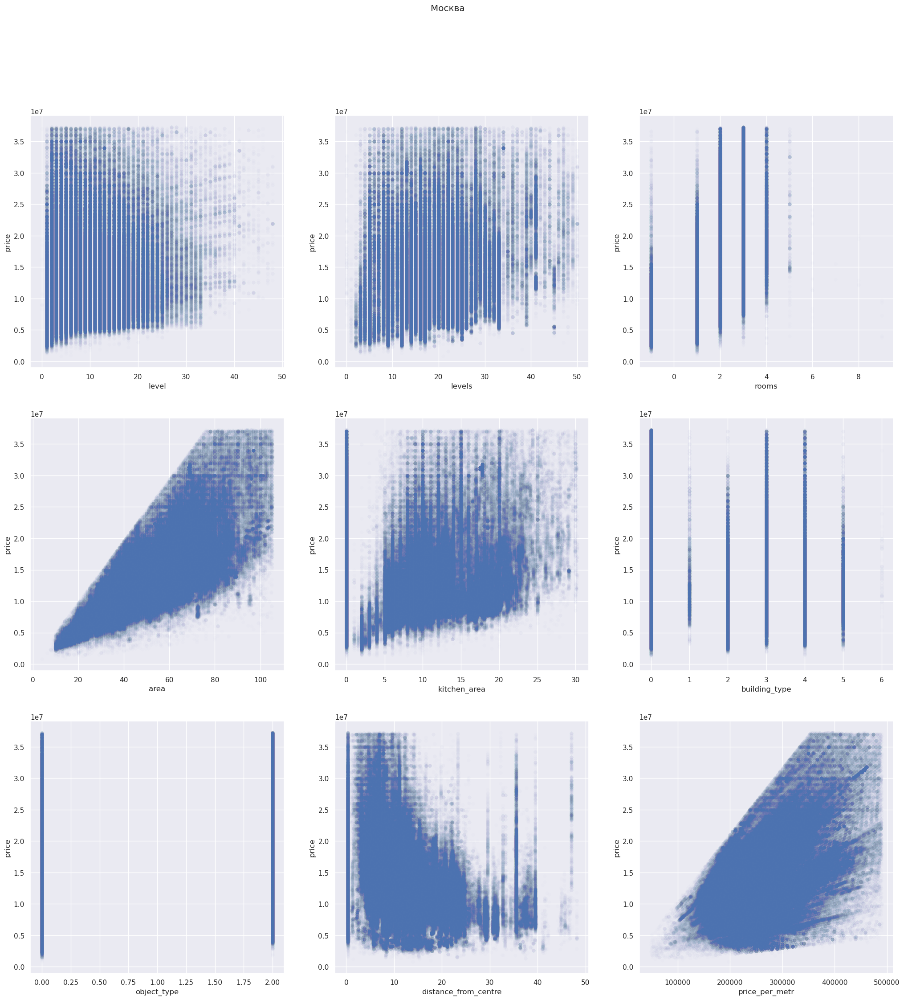

In [21]:
fig, axes = plt.subplots(3, 3, figsize = (25, 25))
sns.set()
fig.suptitle('Москва')

sns.scatterplot(x='level', y='price', data=moscow_df, ax = axes[0, 0], alpha = 0.01)

sns.scatterplot(x='levels', y='price', data=moscow_df, ax = axes[0, 1], alpha = 0.01)

sns.scatterplot(x='rooms', y='price', data=moscow_df, ax = axes[0, 2], alpha = 0.01)

sns.scatterplot(x='area', y='price', data=moscow_df, ax = axes[1, 0], alpha = 0.01)

sns.scatterplot(x='kitchen_area', y='price', data=moscow_df, ax = axes[1, 1], alpha = 0.01)

sns.scatterplot(x='building_type', y='price', data=moscow_df, ax = axes[1, 2], alpha = 0.01)

sns.scatterplot(x='object_type', y='price', data=moscow_df, ax = axes[2, 0], alpha = 0.01)

sns.scatterplot(x='distance_from_centre', y='price', data=moscow_df, ax = axes[2, 1], alpha = 0.01)

sns.scatterplot(x='price_per_metr', y='price', data=moscow_df, ax = axes[2, 2], alpha = 0.01)

<Axes: xlabel='price_per_metr', ylabel='price'>

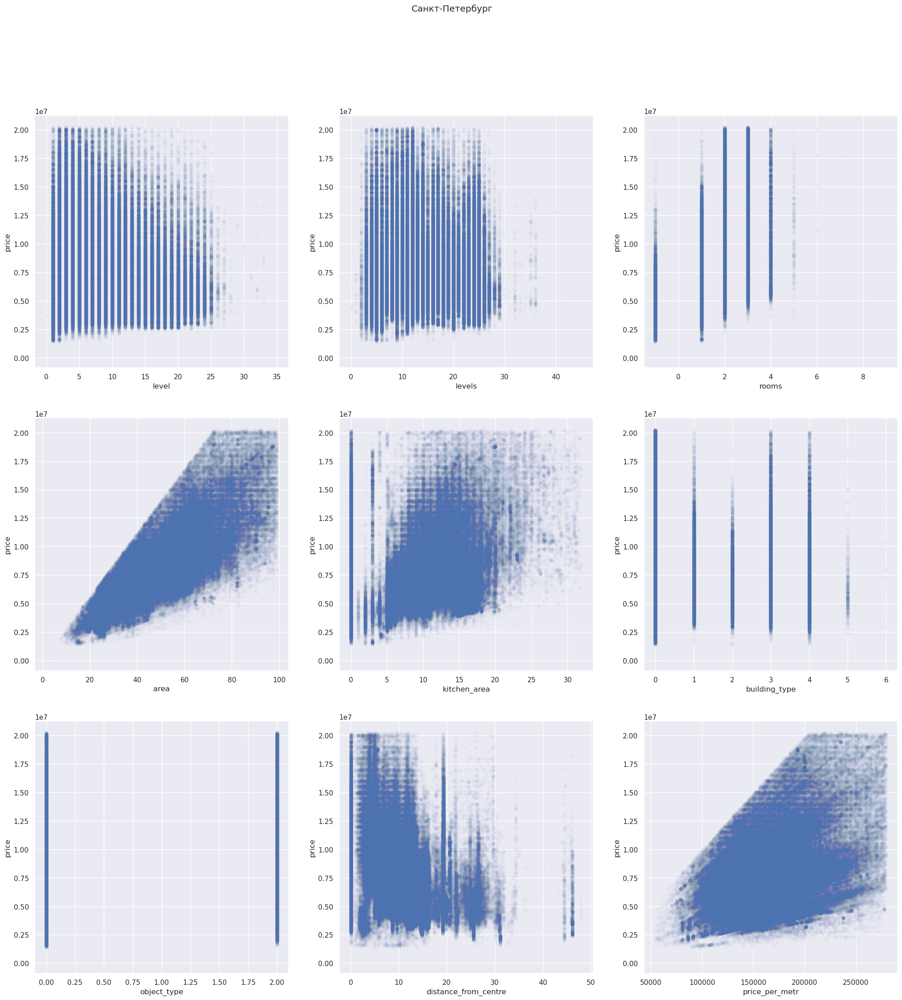

In [22]:
fig, axes = plt.subplots(3, 3, figsize = (25, 25))
sns.set()
fig.suptitle('Санкт-Петербург')

sns.scatterplot(x='level', y='price', data=saint_petersburg_df, ax = axes[0, 0], alpha = 0.01)

sns.scatterplot(x='levels', y='price', data=saint_petersburg_df, ax = axes[0, 1], alpha = 0.01)

sns.scatterplot(x='rooms', y='price', data=saint_petersburg_df, ax = axes[0, 2], alpha = 0.01)

sns.scatterplot(x='area', y='price', data=saint_petersburg_df, ax = axes[1, 0], alpha = 0.01)

sns.scatterplot(x='kitchen_area', y='price', data=saint_petersburg_df, ax = axes[1, 1], alpha = 0.01)

sns.scatterplot(x='building_type', y='price', data=saint_petersburg_df, ax = axes[1, 2], alpha = 0.01)

sns.scatterplot(x='object_type', y='price', data=saint_petersburg_df, ax = axes[2, 0], alpha = 0.01)

sns.scatterplot(x='distance_from_centre', y='price', data=saint_petersburg_df, ax = axes[2, 1], alpha = 0.01)

sns.scatterplot(x='price_per_metr', y='price', data=saint_petersburg_df, ax = axes[2, 2], alpha = 0.01)

<Axes: xlabel='price', ylabel='price_per_metr'>

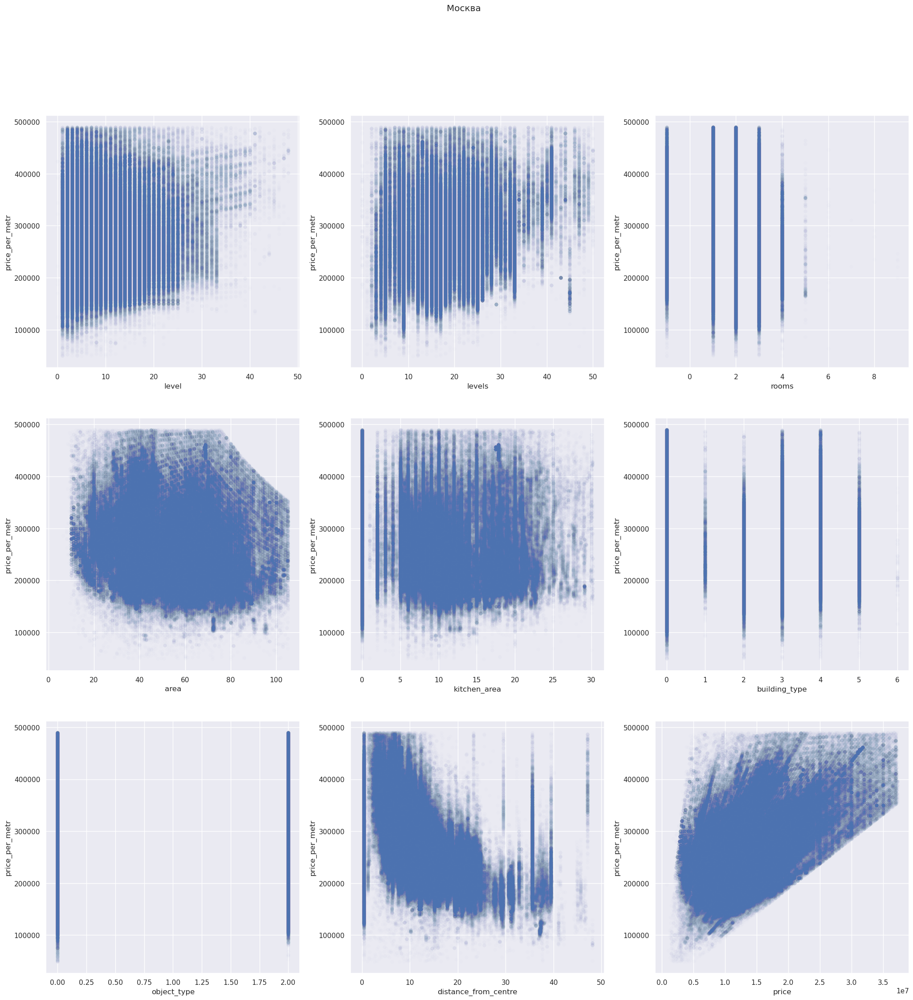

In [23]:
fig, axes = plt.subplots(3, 3, figsize = (25, 25))
sns.set()
fig.suptitle('Москва')

sns.scatterplot(x='level', y='price_per_metr', data=moscow_df, ax = axes[0, 0], alpha = 0.01)

sns.scatterplot(x='levels', y='price_per_metr', data=moscow_df, ax = axes[0, 1], alpha = 0.01)

sns.scatterplot(x='rooms', y='price_per_metr', data=moscow_df, ax = axes[0, 2], alpha = 0.01)

sns.scatterplot(x='area', y='price_per_metr', data=moscow_df, ax = axes[1, 0], alpha = 0.01)

sns.scatterplot(x='kitchen_area', y='price_per_metr', data=moscow_df, ax = axes[1, 1], alpha = 0.01)

sns.scatterplot(x='building_type', y='price_per_metr', data=moscow_df, ax = axes[1, 2], alpha = 0.01)

sns.scatterplot(x='object_type', y='price_per_metr', data=moscow_df, ax = axes[2, 0], alpha = 0.01)

sns.scatterplot(x='distance_from_centre', y='price_per_metr', data=moscow_df, ax = axes[2, 1], alpha = 0.01)

sns.scatterplot(x='price', y='price_per_metr', data=moscow_df, ax = axes[2, 2], alpha = 0.01)

<Axes: xlabel='price', ylabel='price_per_metr'>

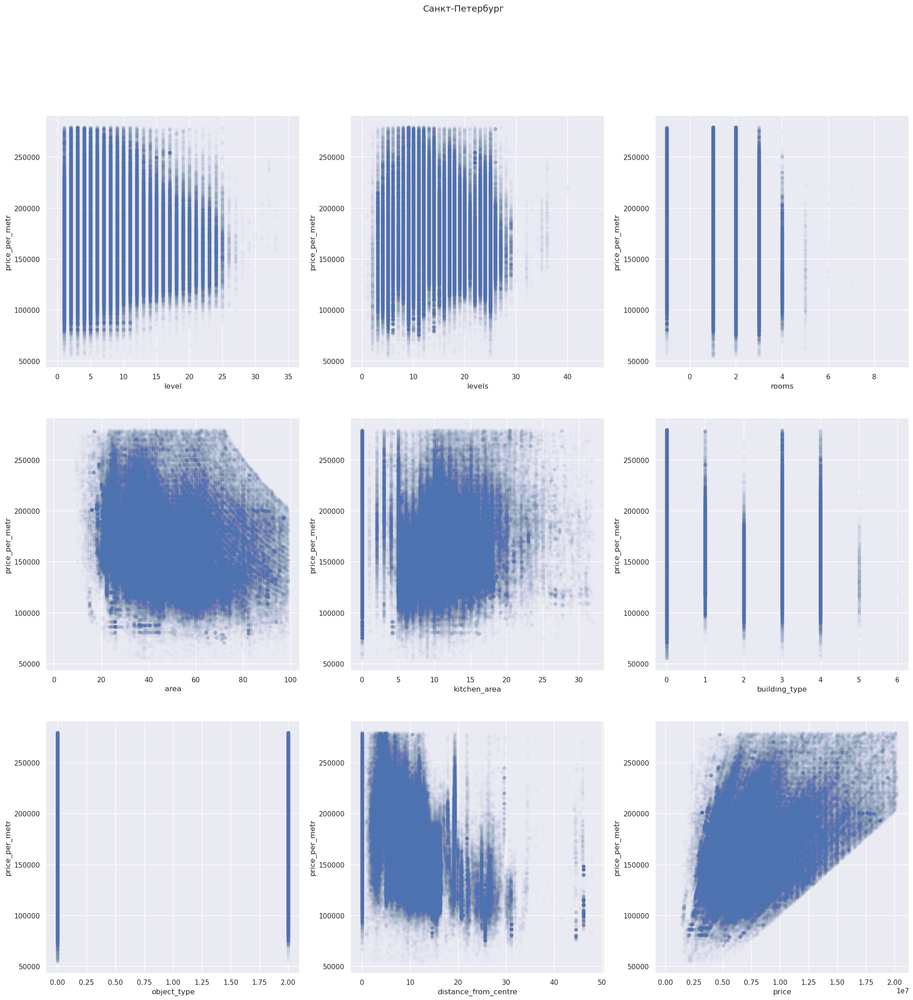

In [24]:
fig, axes = plt.subplots(3, 3, figsize = (25, 25))
sns.set()
fig.suptitle('Санкт-Петербург')

sns.scatterplot(x='level', y='price_per_metr', data=saint_petersburg_df, ax = axes[0, 0], alpha = 0.01)

sns.scatterplot(x='levels', y='price_per_metr', data=saint_petersburg_df, ax = axes[0, 1], alpha = 0.01)

sns.scatterplot(x='rooms', y='price_per_metr', data=saint_petersburg_df, ax = axes[0, 2], alpha = 0.01)

sns.scatterplot(x='area', y='price_per_metr', data=saint_petersburg_df, ax = axes[1, 0], alpha = 0.01)

sns.scatterplot(x='kitchen_area', y='price_per_metr', data=saint_petersburg_df, ax = axes[1, 1], alpha = 0.01)

sns.scatterplot(x='building_type', y='price_per_metr', data=saint_petersburg_df, ax = axes[1, 2], alpha = 0.01)

sns.scatterplot(x='object_type', y='price_per_metr', data=saint_petersburg_df, ax = axes[2, 0], alpha = 0.01)

sns.scatterplot(x='distance_from_centre', y='price_per_metr', data=saint_petersburg_df, ax = axes[2, 1], alpha = 0.01)

sns.scatterplot(x='price', y='price_per_metr', data=saint_petersburg_df, ax = axes[2, 2], alpha = 0.01)

In [25]:
# Функции для отображения значений на долях на круговой диаграмме и чтобы ярлыки не накладывались друг на друга
def func(pct, allvalues):
    if pct > 1:
        absolute = int(pct / 100.*np.sum(allvalues))
        return "{:.1f}%\n({:d})".format(pct, absolute)
    else:
        return ''

def func1(pct, allvalues):
    if pct > 3:
        absolute = int(pct / 100.*np.sum(allvalues))
        return "{:.1f}%\n({:d})".format(pct, absolute)
    else:
        return ''
    
def labels_func(data, q):
    data = data / np.sum(data)
#     for i in data[data < q].keys():
#         data[i] = ''
    return list(data[data > q].keys()) + ['' for i in data[data <= q].keys()] 

In [26]:
# Отдельные датафреймы чтобы заменить числовые категориальные значения на строки
ms_labels = moscow_df.copy()
spb_labels = saint_petersburg_df.copy()

In [27]:
# building type - 0 - Don't know. 1 - Other. 2 - panel. 3 - Monolithic. 4 - Brick. 5 - blocky. 6- Wooden
# The number of rooms can also be as 1, 2 or more. However, there is a type of apartment that is called a studio apartment. I've labeled them "-1".
# object type 0 - Secondary real estate market; 2 - New building.
ms_labels.object_type = ms_labels.object_type.map({0: 'Вторичка', 2: 'Новострой'})
ms_labels.building_type = ms_labels.building_type.map({0: 'Неизвестно', 1: 'Другое', 2: 'Панельный', 3: 'Монолитный', 4: 'Кирпичный', 5: 'Блочный', 6: 'Деревянный'})
spb_labels.object_type = spb_labels.object_type.map({0: 'Вторичка', 2: 'Новострой'})
spb_labels.building_type = spb_labels.building_type.map({0: 'Неизвестно', 1: 'Другое', 2: 'Панельный', 3: 'Монолитный', 4: 'Кирпичный', 5: 'Блочный', 6: 'Деревянный'})

Text(0.0, 1.0, 'Тип здания')

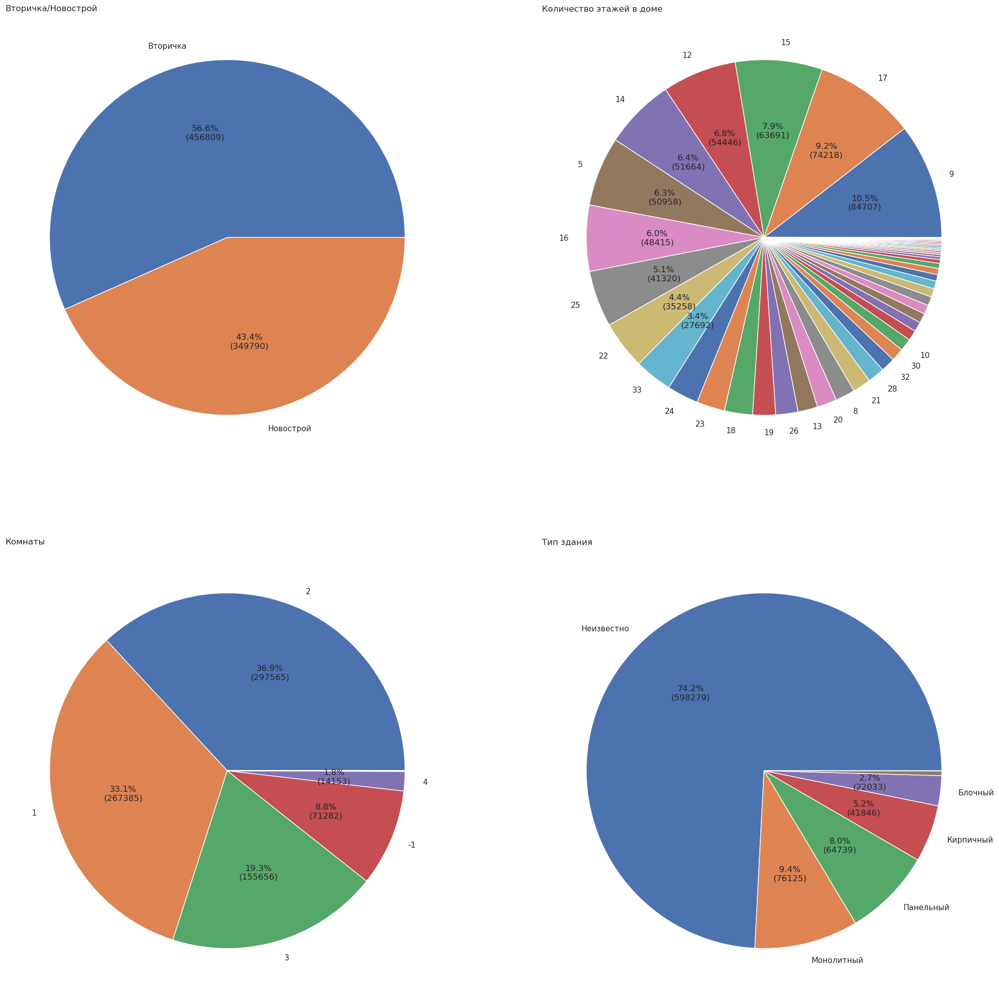

In [28]:
fig, axes = plt.subplots(2, 2, figsize = (25, 25))

axes[0, 0].pie(ms_labels.object_type.value_counts(), labels = ms_labels.object_type.value_counts().keys(), autopct = lambda pct: func(pct, ms_labels.object_type.value_counts()))
axes[0, 0].set_title('Вторичка/Новострой', loc = 'left')

labels = labels_func(ms_labels.levels.value_counts(), 0.01)
axes[0, 1].pie(ms_labels.levels.value_counts(), labels = labels, autopct = lambda pct: func1(pct, ms_labels.object_type.value_counts()))
axes[0, 1].set_title('Количество этажей в доме', loc = 'left')

labels = labels_func(ms_labels.rooms.value_counts(), 0.01)
axes[1, 0].pie(ms_labels.rooms.value_counts(), labels = labels, autopct = lambda pct: func(pct, ms_labels.object_type.value_counts()))
axes[1, 0].set_title('Комнаты', loc = 'left')

labels = labels_func(ms_labels.building_type.value_counts(), 0.01)
axes[1, 1].pie(ms_labels.building_type.value_counts(), labels = labels, autopct = lambda pct: func(pct, ms_labels.object_type.value_counts()))
axes[1, 1].set_title('Тип здания', loc = 'left')

Text(0.0, 1.0, 'Тип здания')

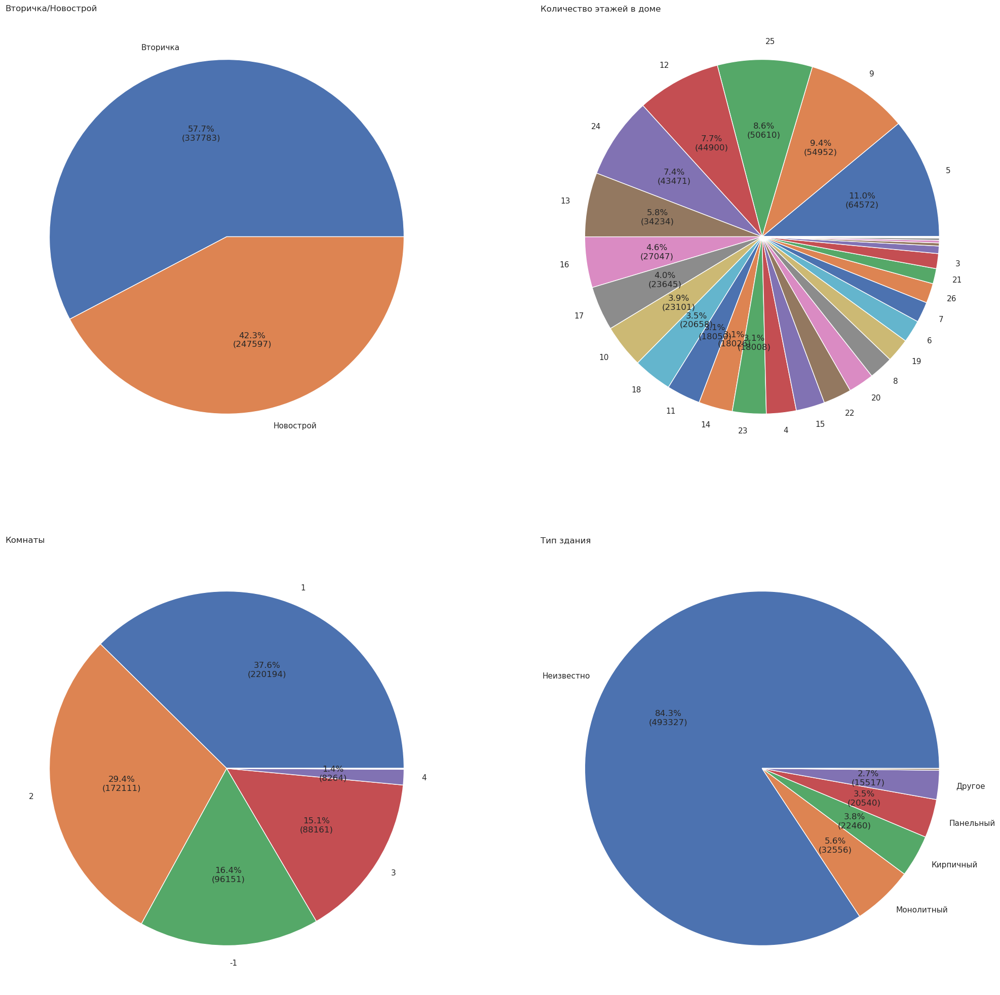

In [29]:
fig, axes = plt.subplots(2, 2, figsize = (25, 25))

axes[0, 0].pie(spb_labels.object_type.value_counts(), labels = spb_labels.object_type.value_counts().keys(), autopct = lambda pct: func(pct, spb_labels.object_type.value_counts()))
axes[0, 0].set_title('Вторичка/Новострой', loc = 'left')

labels = labels_func(spb_labels.levels.value_counts(), 0.01)
axes[0, 1].pie(spb_labels.levels.value_counts(), labels = labels, autopct = lambda pct: func1(pct, spb_labels.object_type.value_counts()))
axes[0, 1].set_title('Количество этажей в доме', loc = 'left')

labels = labels_func(spb_labels.rooms.value_counts(), 0.01)
axes[1, 0].pie(spb_labels.rooms.value_counts(), labels = labels, autopct = lambda pct: func(pct, spb_labels.object_type.value_counts()))
axes[1, 0].set_title('Комнаты', loc = 'left')

labels = labels_func(spb_labels.building_type.value_counts(), 0.01)
axes[1, 1].pie(spb_labels.building_type.value_counts(), labels = labels, autopct = lambda pct: func(pct, spb_labels.object_type.value_counts()))
axes[1, 1].set_title('Тип здания', loc = 'left')

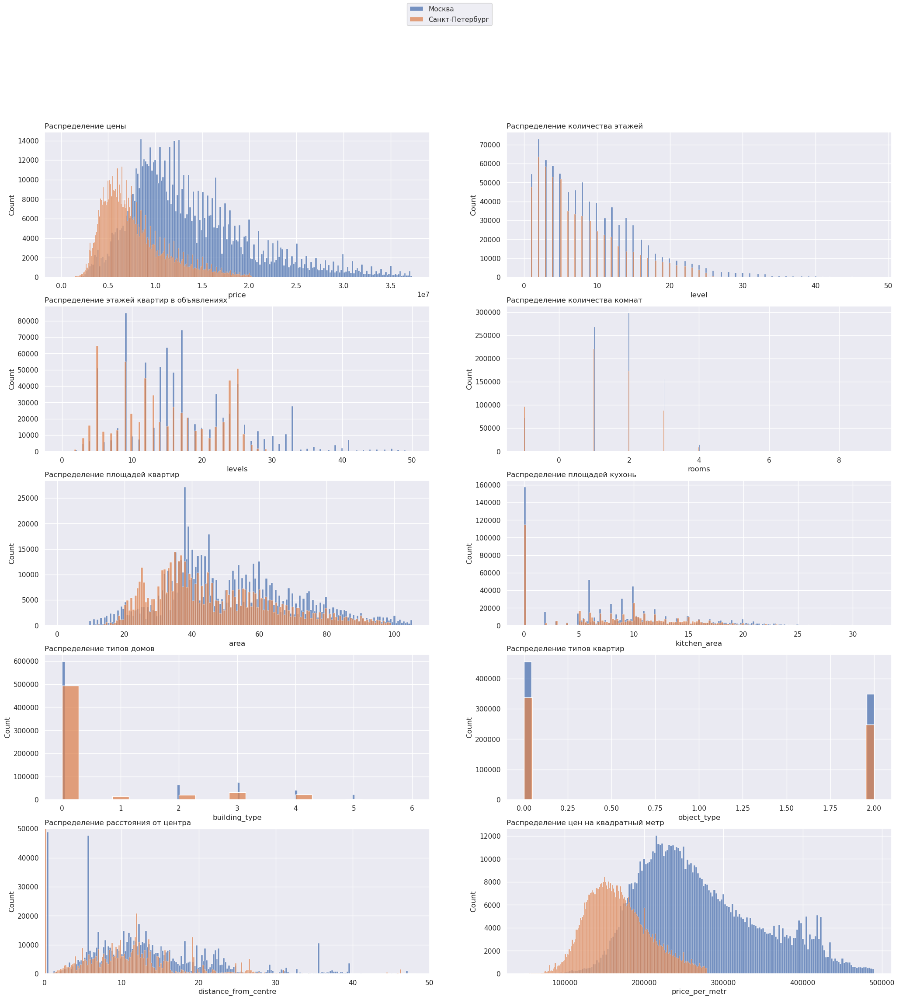

In [30]:
fig, axes = plt.subplots(5, 2, figsize = (25, 25))
sns.set()

sns.histplot(data = moscow_df.price, ax = axes[0, 0], label="Москва")
sns.histplot(data = saint_petersburg_df.price, ax = axes[0, 0], label="Санкт-Петербург")
axes[0, 0].set_title('Распределение цены', loc = 'left')

sns.histplot(data = moscow_df.level, ax = axes[0, 1])
sns.histplot(data = saint_petersburg_df.level, ax = axes[0, 1])
axes[0, 1].set_title('Распределение количества этажей', loc = 'left')

sns.histplot(data = moscow_df.levels, ax = axes[1, 0])
sns.histplot(data = saint_petersburg_df.levels, ax = axes[1, 0])
axes[1, 0].set_title('Распределение этажей квартир в объявлениях', loc = 'left')

sns.histplot(data = moscow_df.rooms, ax = axes[1, 1])
sns.histplot(data = saint_petersburg_df.rooms, ax = axes[1, 1])
axes[1, 1].set_title('Распределение количества комнат', loc = 'left')

sns.histplot(data = moscow_df.area, ax = axes[2, 0])
sns.histplot(data = saint_petersburg_df.area, ax = axes[2, 0])
axes[2, 0].set_title('Распределение площадей квартир', loc = 'left')
axes[4, 0].set_xlim([0, 200])

sns.histplot(data = moscow_df.kitchen_area, ax = axes[2, 1])
sns.histplot(data = saint_petersburg_df.kitchen_area, ax = axes[2, 1])
axes[2, 1].set_title('Распределение площадей кухонь', loc = 'left')
axes[4, 0].set_xlim([0, 40])
axes[4, 0].set_ylim([0, 50000])

sns.histplot(data = moscow_df.building_type, ax = axes[3, 0])
sns.histplot(data = saint_petersburg_df.building_type, ax = axes[3, 0])
axes[3, 0].set_title('Распределение типов домов', loc = 'left')

sns.histplot(data = moscow_df.object_type, ax = axes[3, 1])
sns.histplot(data = saint_petersburg_df.object_type, ax = axes[3, 1])
axes[3, 1].set_title('Распределение типов квартир', loc = 'left')

sns.histplot(data = moscow_df.distance_from_centre, ax = axes[4, 0])
sns.histplot(data = saint_petersburg_df.distance_from_centre, ax = axes[4, 0])
axes[4, 0].set_title('Распределение расстояния от центра', loc = 'left')
axes[4, 0].set_xlim([0, 50])
axes[4, 0].set_ylim([0, 50000])

sns.histplot(data = moscow_df.price_per_metr, ax = axes[4, 1])
sns.histplot(data = saint_petersburg_df.price_per_metr, ax = axes[4, 1])
axes[4, 1].set_title('Распределение цен на квадратный метр', loc = 'left')

fig.legend(loc='outside upper center')

In [31]:
moscow_df.building_type = moscow_df.building_type.map({0: 'Неизвестно', 1: 'Другое', 2: 'Панельный', 3: 'Монолитный', 4: 'Кирпичный', 5: 'Блочный', 6: 'Деревянный'})
moscow_df = pd.get_dummies(moscow_df, columns = ['building_type'])

In [32]:
saint_petersburg_df.building_type = saint_petersburg_df.building_type.map({0: 'Неизвестно', 1: 'Другое', 2: 'Панельный', 3: 'Монолитный', 4: 'Кирпичный', 5: 'Блочный', 6: 'Деревянный'})
saint_petersburg_df = pd.get_dummies(saint_petersburg_df, columns = ['building_type'])

In [33]:
saint_petersburg_df

,price,level,levels,rooms,area,kitchen_area,object_type,price_per_metr,distance_from_centre,building_type_Блочный,building_type_Деревянный,building_type_Другое,building_type_Кирпичный,building_type_Монолитный,building_type_Неизвестно,building_type_Панельный
15,8865000,10,13,2,66.700,14.600,2,132908.546,11.167,0,0,0,1,0,0,0
151,8865000,11,13,2,66.700,14.600,2,132908.546,11.167,0,0,0,1,0,0,0
221,3965000,20,23,1,30.500,13.000,2,130000.000,12.990,0,0,0,0,0,1,0
231,7408788,17,17,1,37.110,12.920,2,199643.977,5.693,0,0,1,0,0,0,0
424,12624923,13,15,2,63.180,22.000,2,199824.676,19.329,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11358063,5900000,2,9,1,36.000,6.500,0,163888.889,10.936,0,0,0,0,0,1,0
11358070,14000000,3,6,2,54.500,16.000,0,256880.734,4.691,0,0,0,0,0,1,0
11358121,4535000,6,10,1,35.000,10.200,0,129571.429,22.130,0,0,0,0,0,1,0
11358122,6000000,8,16,-1,26.000,4.000,0,230769.231,9.352,0,0,0,0,0,1,0


In [34]:
moscow_corr = moscow_df[moscow_df.columns[~moscow_df.columns.isin(['area', 'price'])]].corr()
spb_corr = saint_petersburg_df[saint_petersburg_df.columns[~saint_petersburg_df.columns.isin(['area', 'price'])]].corr()

<Axes: >

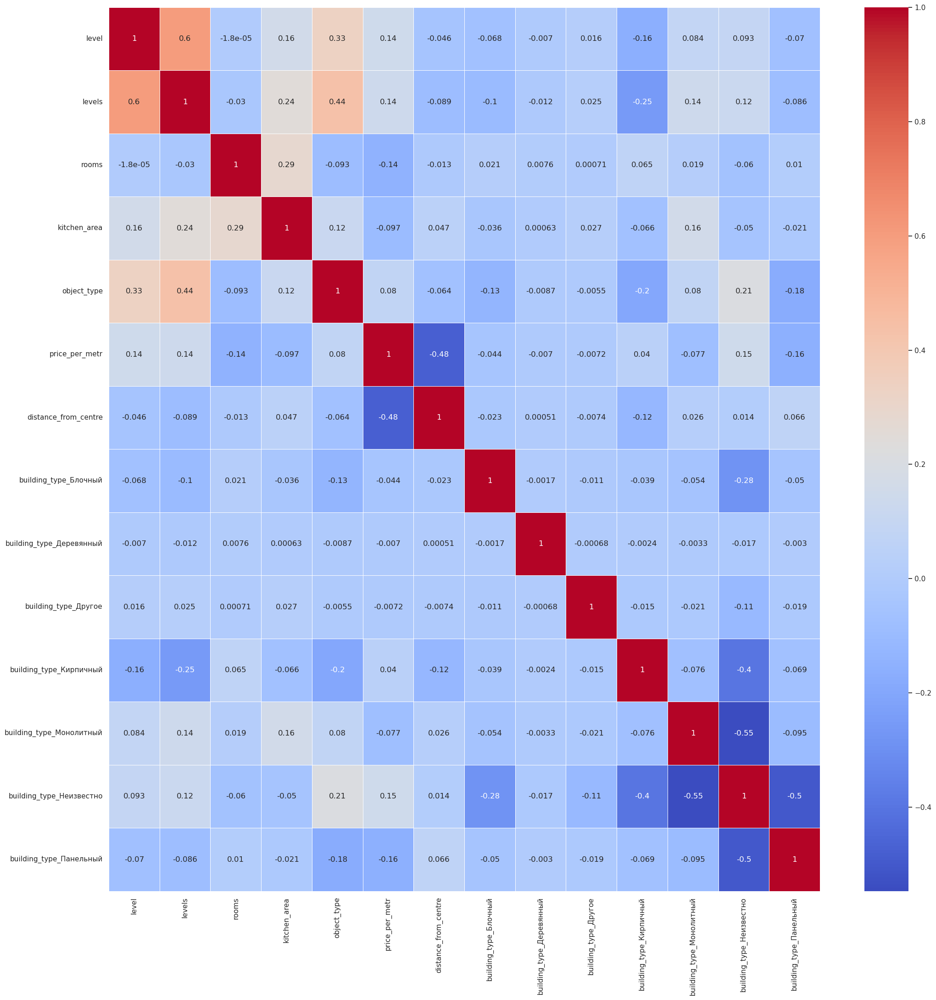

In [35]:
fig, ax = plt.subplots(figsize=(25,25))         
sns.heatmap(moscow_corr, ax=ax, annot=True, linewidths=.5, cmap = 'coolwarm')

<Axes: >

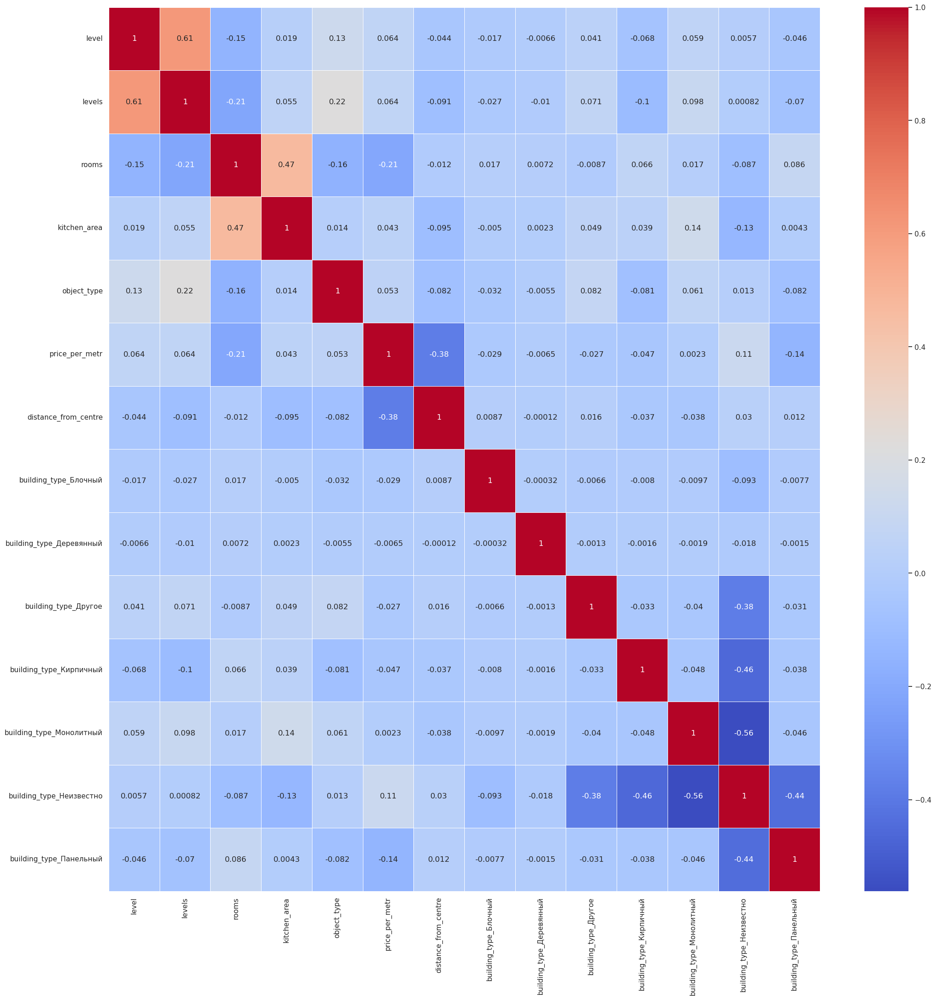

In [36]:
fig, ax = plt.subplots(figsize=(25,25)) 
sns.heatmap(spb_corr, ax=ax, annot=True, linewidths=.5, cmap = 'coolwarm')

проверка неоднородности

In [37]:
for i in moscow_df.columns:
    _, p =stats.ks_2samp(moscow_df[i], saint_petersburg_df[i])
    print(f'p значение однородности {i}: ', p)

p значение однородности price:  0.0
p значение однородности level:  0.0
p значение однородности levels:  0.0
p значение однородности rooms:  0.0
p значение однородности area:  0.0
p значение однородности kitchen_area:  0.0
p значение однородности object_type:  4.060584876825499e-34
p значение однородности price_per_metr:  0.0
p значение однородности distance_from_centre:  0.0
p значение однородности building_type_Блочный:  3.658782720016826e-195
p значение однородности building_type_Деревянный:  1.0
p значение однородности building_type_Другое:  2.1613444152279203e-145
p значение однородности building_type_Кирпичный:  3.1557670615554936e-54
p значение однородности building_type_Монолитный:  0.0
p значение однородности building_type_Неизвестно:  0.0
p значение однородности building_type_Панельный:  0.0


Линейные регрессии

In [38]:
moscow_df

,price,level,levels,rooms,area,kitchen_area,object_type,price_per_metr,distance_from_centre,building_type_Блочный,building_type_Деревянный,building_type_Другое,building_type_Кирпичный,building_type_Монолитный,building_type_Неизвестно,building_type_Панельный
10,3350000,1,19,-1,10.100,2.000,0,331683.168,5.737,0,0,0,0,1,0,0
38,22112640,8,29,3,69.800,11.600,2,316800.000,9.426,0,0,0,0,0,1,0
140,7400000,9,9,1,32.300,5.200,0,229102.167,6.199,0,0,0,0,1,0,0
150,3000000,1,5,1,13.600,2.000,0,220588.235,4.618,0,0,0,1,0,0,0
157,25173570,19,22,2,90.500,0.000,2,278160.994,6.096,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11358120,6612000,12,16,-1,20.500,0.000,2,322536.585,21.922,0,0,0,0,0,1,0
11358125,22129552,20,22,3,85.840,9.600,2,257800.000,20.824,0,0,0,0,0,1,0
11358126,9080000,11,16,2,35.500,14.800,2,255774.648,21.922,0,0,0,0,0,1,0
11358129,8595000,2,10,1,37.700,13.900,2,227984.085,21.922,0,0,0,0,0,1,0


In [39]:
X_msk = moscow_df.drop(columns = ['price','price_per_metr', 'area'])
y_msk = moscow_df.price_per_metr

X_spb = saint_petersburg_df.drop(columns = ['price', 'price_per_metr', 'area'])
y_spb = saint_petersburg_df.price_per_metr

Проверка статистической значимости уравнения регрессии <br>
H0: R^2 = 0, w1 = w2 = ... = wn = 0 <br>
H1: R^2 != 0 <br>
При уровне значимости 0.1%

In [41]:
X_msk.head()

,level,levels,rooms,kitchen_area,object_type,distance_from_centre,building_type_Блочный,building_type_Деревянный,building_type_Другое,building_type_Кирпичный,building_type_Монолитный,building_type_Неизвестно,building_type_Панельный
10,1,19,-1,2.000,0,5.737,0,0,0,0,1,0,0
38,8,29,3,11.600,2,9.426,0,0,0,0,0,1,0
140,9,9,1,5.200,0,6.199,0,0,0,0,1,0,0
150,1,5,1,2.000,0,4.618,0,0,0,1,0,0,0
157,19,22,2,0.000,2,6.096,0,0,0,0,0,1,0


In [42]:
X_spb.head()

,level,levels,rooms,kitchen_area,object_type,distance_from_centre,building_type_Блочный,building_type_Деревянный,building_type_Другое,building_type_Кирпичный,building_type_Монолитный,building_type_Неизвестно,building_type_Панельный
15,10,13,2,14.600,2,11.167,0,0,0,1,0,0,0
151,11,13,2,14.600,2,11.167,0,0,0,1,0,0,0
221,20,23,1,13.000,2,12.990,0,0,0,0,0,1,0
231,17,17,1,12.920,2,5.693,0,0,1,0,0,0,0
424,13,15,2,22.000,2,19.329,0,0,0,0,0,1,0


In [43]:
reg = LinearRegression()
reg.fit(X_msk, y_msk)
print(mean_absolute_error(y_msk, reg.predict(X_msk)), '\n',
     mean_absolute_error(y_spb, reg.predict(X_spb)), '\n',
     reg.coef_)

49964.56907281253 
 118037.06723064238 
 [  1152.40746913    500.58532312  -9096.13702083   -629.82211951
  -3183.54739831  -4353.02667106  -5861.89221338 -19518.45369472
   1069.04504141  19020.93484484   -563.55566707  21511.82146084
 -15657.89977192]


In [44]:
msk_coef = reg.coef_
mae_mskmsk = mean_absolute_error(y_msk, reg.predict(X_msk))
mae_mskspb = mean_absolute_error(y_spb, reg.predict(X_spb))
msk_pred = reg.predict(X_msk)
r_msk = r2_score(y_msk, msk_pred)
n, m = X_msk.shape
F = r_msk/(1-r_msk) * (n - m - 1)/m
stats.f.ppf(0.999, m, n-m-1) < F

True

In [45]:
reg = LinearRegression()
reg.fit(X_spb, y_spb)
print(mean_absolute_error(y_spb, reg.predict(X_spb)), '\n',
     mean_absolute_error(y_msk, reg.predict(X_msk)), '\n',
     reg.coef_)

27019.989064354948 
 116308.17621138674 
 [   274.28981161   -382.71293269  -8830.44632686    969.85895509
  -1071.95315517  -2131.75342086  -9029.34814534 -13426.60341415
   7061.09493384   2347.78708868   9596.89284265  15202.67990219
 -11752.50320788]


In [46]:
spb_coef = reg.coef_
mae_spbspb = mean_absolute_error(y_spb, reg.predict(X_spb))
mae_spbmsk = mean_absolute_error(y_msk, reg.predict(X_msk))
spb_pred = reg.predict(X_spb)
r_spb = r2_score(y_spb, spb_pred)
n, m = X_spb.shape
F = r_spb/(1-r_spb) * (n - m - 1)/m
stats.f.ppf(0.999, m, n-m-1) < F

True

Т.к. значение критерия больше критического, то нулевая гипотеза отклоняется и уравнение статистически значимо

In [48]:
X_msk.columns.shape

(13,)

In [50]:
pd.DataFrame(np.array([np.hstack([spb_coef, mae_spbspb, mae_spbmsk, r_spb]).reshape(1, 16),
                       np.hstack([msk_coef, mae_mskmsk, mae_mskspb, r_msk]).reshape(1, 16)]).reshape(2, 16),
             columns = ['Количество этажей', 'Этаж', 'Количество комнат',
                       'Площадь кухни', 'Вторичный рынок/Новостройка', 'Расстояние от центра', 'Блочный', 'Деревянный', 'Другой', 'Кирпичный', 'Монолитный', 'Неизвестный', 'Панельный',
                       'MAE на данных СПБ', 'MAE на данных МСК', 'R^2'],
             index = ['Санкт-Петербург', 'Москва'])

,Количество этажей,Этаж,Количество комнат,Площадь кухни,Вторичный рынок/Новостройка,Расстояние от центра,Блочный,Деревянный,Другой,Кирпичный,Монолитный,Неизвестный,Панельный,MAE на данных СПБ,MAE на данных МСК,R^2
Санкт-Петербург,274.290,-382.713,-8830.446,969.859,-1071.953,-2131.753,-9029.348,-13426.603,7061.095,2347.787,9596.893,15202.680,-11752.503,27019.989,116308.176,0.230
Москва,1152.407,500.585,-9096.137,-629.822,-3183.547,-4353.027,-5861.892,-19518.454,1069.045,19020.935,-563.556,21511.821,-15657.900,49964.569,118037.067,0.294


Проверка гипотезы об однородности выборок: <br>
H0: F_1 = F_2 <br>
H1: F_1 != F_2 <br>
При уровне значимости 0.1%

In [51]:
stat, p_value = stats.mannwhitneyu(y_msk, y_spb)

In [52]:
p_value > 0.001

False

Т.к. значение p_value меньше уровня значимости нулевая гипотеза отклоняется и выборки неоднородны

Проверка гипотезы о значимости корреляции факторов удаленности от центра и цены <br>
H0: Коэффициент корреляции незначим <br>
H1: Коэффициент корреляции значим

In [53]:
corr_spb, _ = stats.pearsonr(X_spb.distance_from_centre, y_spb)
T = corr_spb * np.sqrt(X_spb.shape[0] - 2) / np.sqrt(1 - corr_spb**2)
t_cr = stats.t.ppf(0.999, X_spb.shape[0] - 2)

In [54]:
corr_spb

-0.3797266848405898

In [55]:
np.abs(T) > t_cr

True

In [56]:
corr_msk, _ = stats.pearsonr(X_msk.distance_from_centre, y_msk)
T = corr_msk * np.sqrt(X_msk.shape[0] - 2) / np.sqrt(1 - corr_msk**2)
t_cr = stats.t.ppf(0.999, X_msk.shape[0] - 2)

In [57]:
corr_msk

-0.4780665268950277

In [58]:
np.abs(T) > t_cr

True

Нулевая гипотеза отвергается, значит коэффициент корреляции значим в обоих случаях. Чем дальше от центра - тем цена ниже

Применение алгоритмов catboost

In [59]:
%%time
final_model = CatBoostRegressor(
    silent=True,
    learning_rate=0.1,
    iterations=1150,
    eval_metric='R2',
    depth=8,
    task_type = 'GPU'
)

final_model.fit(X_msk, y_msk, plot = True)
y_pred_cat = final_model.predict(X_msk)
print(mean_absolute_error(y_msk, y_pred_cat))

feature_importances = pd.DataFrame(
    zip(X_msk.columns, final_model.get_feature_importance()),
    columns=['feature_name', 'importance']
)

feature_importances.sort_values(by='importance', ascending=False, inplace=True)
feature_importances.head(20)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Default metric period is 5 because R2 is/are not implemented for GPU
Metric R2 is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


27484.72301946112
CPU times: user 1min 56s, sys: 36.3 s, total: 2min 32s
Wall time: 1min 25s


,feature_name,importance
5,distance_from_centre,45.253
1,levels,24.331
4,object_type,8.439
3,kitchen_area,8.346
2,rooms,6.455
11,building_type_Неизвестно,3.048
0,level,2.816
10,building_type_Монолитный,0.490
12,building_type_Панельный,0.479
9,building_type_Кирпичный,0.214


In [60]:
%%time
final_model = CatBoostRegressor(
    silent=True,
    learning_rate=0.1,
    iterations=1150,
    eval_metric='R2',
    depth=8,
    task_type = 'GPU'
)

final_model.fit(X_spb, y_spb, plot = True)
y_pred_cat = final_model.predict(X_spb)
print(mean_absolute_error(y_spb, y_pred_cat))

feature_importances = pd.DataFrame(
    zip(X_spb.columns, final_model.get_feature_importance()),
    columns=['feature_name', 'importance']
)

feature_importances.sort_values(by='importance', ascending=False, inplace=True)
feature_importances.head(20)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Default metric period is 5 because R2 is/are not implemented for GPU
Metric R2 is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


16586.546621434965
CPU times: user 1min 52s, sys: 34.6 s, total: 2min 26s
Wall time: 1min 20s


,feature_name,importance
5,distance_from_centre,40.894
1,levels,25.398
4,object_type,10.132
2,rooms,9.389
3,kitchen_area,8.669
0,level,2.156
11,building_type_Неизвестно,1.868
12,building_type_Панельный,0.917
10,building_type_Монолитный,0.213
8,building_type_Другое,0.196
